![AutodistillMMDetection](http://drive.google.com/uc?id=1cC2auXRxnN2ugydLIbdb7qoe6YS8XbDn)


# Train MMDetection with Autodistill

[Autodistill](https://github.com/autodistill/autodistill) is a tool by [Roboflow](https://roboflow.com/) designed to streamline the process of creating high-quality datasets for machine learning models. This notebook shows how to use [MMDetection](https://github.com/open-mmlab/mmdetection) models as target models for dataset prepared by an Autodistill base model.

## Contents

In this tutorial, we are going to cover:
- Install Required Packages
- Prepare dataset with Autodistill base model

In [1]:
import os
HOME = os.getcwd()
print(HOME)

/content


### Check GPU status and CUDA version

In [2]:
!nvidia-smi

Sat Jun 22 03:37:58 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   43C    P8              11W /  72W |      1MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# 📦Install Required Packages

### 🔥Rollback PyTorch Version

For a quick installation of MMCV, we roll back the PyTorch version to 2.1.0. You need to install MMCV version 2.1.0 since MMDetection requires a version lower than 2.2.0. However, the prebuilt installation of MMCV 2.1.0 only supports PyTorch version 2.1.x (see the MMCV [documentation](https://mmcv.readthedocs.io/en/latest/get_started/installation.html#:~:text=Select%20the%20appropriate,torch2.1/index.html)).

In [3]:
!pip install -q torch==2.1.0 torchvision==0.16.0 torchaudio==2.1.0 torchtext==0.16 --index-url https://download.pytorch.org/whl/cu121

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 GB 992.7 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 93.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 73.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 83.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 MB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 109.7 MB/s eta 0:00:00


### Install MMEngine and MMCV.
⚠️ MMCV versions higher than 2.1.0 may not be compatible with recent MMDetection versions (as of Jun 2024).

In [4]:
!pip install -q mmengine>=0.7.0
!pip install -q mmcv==2.1.0 -f https://download.openmmlab.com/mmcv/dist/cu121/torch2.1/index.html

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.1/94.1 MB 12.2 MB/s eta 0:00:00


### Install MMDetection from source

We could install the prepackaged version, but we choose to install from the original repository for easier configuration modifications and checkpoint downloads.

In [5]:
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

Cloning into 'mmdetection'...
remote: Enumerating objects: 38019, done.
remote: Total 38019 (delta 0), reused 0 (delta 0), pack-reused 38019
Receiving objects: 100% (38019/38019), 63.18 MiB | 13.28 MiB/s, done.
Resolving deltas: 100% (26232/26232), done.
/content/mmdetection


In [6]:
!pip install --q -e .

  Preparing metadata (setup.py) ... done


In [7]:
%cd ..

/content


### 🧪 Install Autodistill

In [8]:
!pip install -q autodistill autodistill-grounded-sam roboflow supervision==0.9.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 24.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 87.1 MB/s eta 0:00:00


# 💻 Prepare Dataset with Autodistill Base Model

To prepare a dataset using the Autodistill repository, please follow the [official tutorial](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-auto-train-yolov8-model-with-autodistill.ipynb). Be sure to check the first three sections: *Before You Start*, *Image Dataset Preparation*, and *Autolabel Dataset*.

💡💡 This notebook runs the same code from the [Autodistill tutorial](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-auto-train-yolov8-model-with-autodistill.ipynb) to prepare the dataset. If you don't want to run these sections, you can skip to [MMDetection Training](https://colab.research.google.com/drive/1YNyuyXYqgJoCBbTr_kULl8lDb8ZsIYLA#scrollTo=sKuIfXmgUBtM&line=1&uniqifier=1). 💡💡

### 🖼️ Image dataset preperation

In [9]:
!mkdir {HOME}/images

### Download raw videos

In [10]:
!mkdir {HOME}/videos
%cd {HOME}/videos

# download zip file containing videos
!wget https://media.roboflow.com/milk.zip

# unzip videos
!unzip milk.zip

/content/videos
--2024-06-22 03:40:26--  https://media.roboflow.com/milk.zip
Resolving media.roboflow.com (media.roboflow.com)... 34.110.133.209
Connecting to media.roboflow.com (media.roboflow.com)|34.110.133.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1192719976 (1.1G) [application/zip]
Saving to: ‘milk.zip’

milk.zip            100%[===================>]   1.11G  16.1MB/s    in 70s     

2024-06-22 03:41:37 (16.2 MB/s) - ‘milk.zip’ saved [1192719976/1192719976]

Archive:  milk.zip
  inflating: milk-video-1.mov        
  inflating: milk-video-2.mov        
  inflating: milk-video-3.mov        
  inflating: milk-video-4.mov        
  inflating: milk-video-5.mov        
  inflating: milk-video-6.mov        
  inflating: milk-video-7.mov        
  inflating: milk-video-8.mov        


### Convert videos into images

In [11]:
VIDEO_DIR_PATH = f"{HOME}/videos"
IMAGE_DIR_PATH = f"{HOME}/images"
FRAME_STRIDE = 10

In [12]:
import supervision as sv
from tqdm.notebook import tqdm

video_paths = sv.list_files_with_extensions(
    directory=VIDEO_DIR_PATH,
    extensions=["mov", "mp4"])

TEST_VIDEO_PATHS, TRAIN_VIDEO_PATHS = video_paths[:2], video_paths[2:]

for video_path in tqdm(TRAIN_VIDEO_PATHS):
    video_name = video_path.stem
    image_name_pattern = video_name + "-{:05d}.png"
    with sv.ImageSink(target_dir_path=IMAGE_DIR_PATH, image_name_pattern=image_name_pattern) as sink:
        for image in sv.get_video_frames_generator(source_path=str(video_path), stride=FRAME_STRIDE):
            sink.save_image(image=image)

  0%|          | 0/6 [00:00<?, ?it/s]

### Display image sample

In [13]:
import supervision as sv

image_paths = sv.list_files_with_extensions(
    directory=IMAGE_DIR_PATH,
    extensions=["png", "jpg", "jpg"])

print('image count:', len(image_paths))

image count: 153


In [14]:
IMAGE_DIR_PATH = f"{HOME}/images"
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)

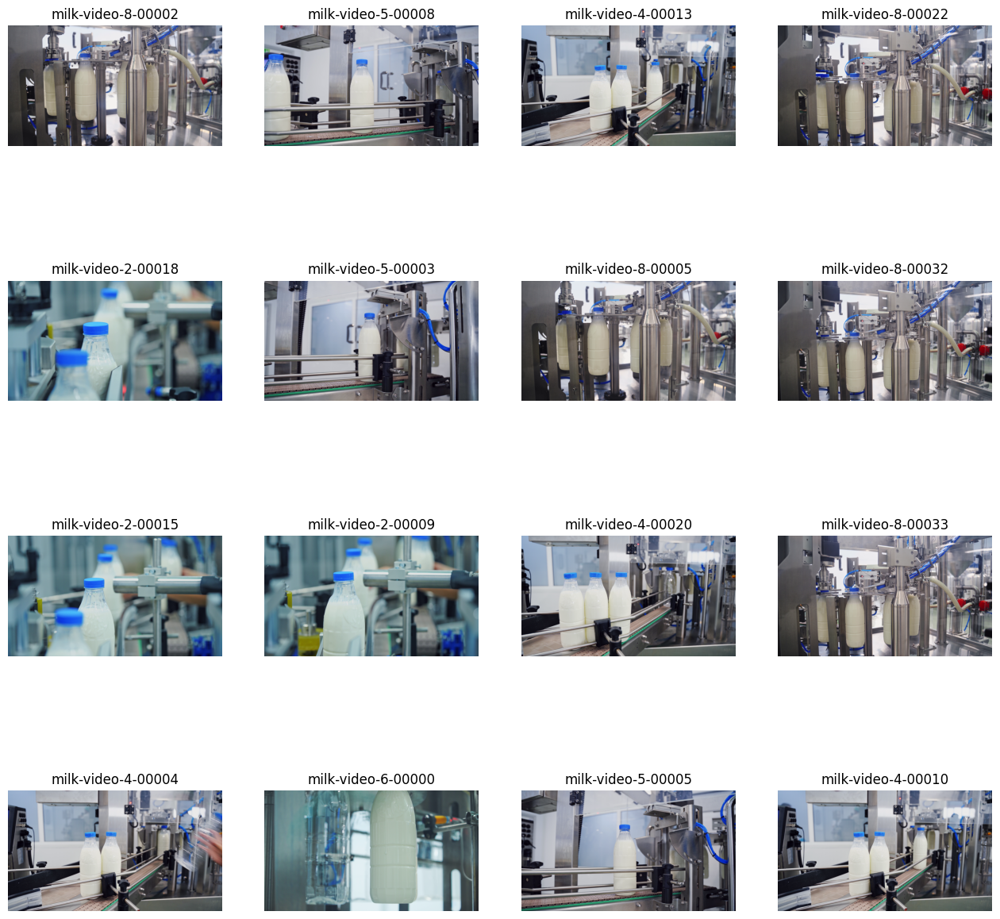

In [15]:
import cv2
import supervision as sv

titles = [
    image_path.stem
    for image_path
    in image_paths[:SAMPLE_SIZE]]
images = [
    cv2.imread(str(image_path))
    for image_path
    in image_paths[:SAMPLE_SIZE]]

sv.plot_images_grid(images=images, titles=titles, grid_size=SAMPLE_GRID_SIZE, size=SAMPLE_PLOT_SIZE)

### 🏷️ Autolabel dataset

#### Define ontology

**Ontology** - an Ontology defines how your Base Model is prompted, what your Dataset will describe, and what your Target Model will predict.

In [16]:
from autodistill.detection import CaptionOntology

ontology=CaptionOntology({
    "milk bottle": "bottle",
    "blue cap": "cap"
})

### Initiate base model and autolabel

**Base Model** - A Base Model is a large foundation model that knows a lot about a lot. We use a Base Model (along with unlabeled input data and an Ontology) to create a Dataset.

In [17]:
DATASET_DIR_PATH = f"{HOME}/dataset"

**NOTE:** Base Models are slow...

In [18]:
from autodistill_grounded_sam import GroundedSAM

base_model = GroundedSAM(ontology=ontology)
dataset = base_model.label(
    input_folder=IMAGE_DIR_PATH,
    extension=".png",
    output_folder=DATASET_DIR_PATH)

trying to load grounding dino directly
downloading dino model weights


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)


final text_encoder_type: bert-base-uncased



The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Labeling /content/images/milk-video-8-00002.png:   0%|          | 0/153 [00:00<?, ?it/s]The `device` argument is deprecated and will be removed in v5 of Transformers.
torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
None of the inputs have requires_grad=True. Gradients will be None
The `device` argument is deprecated and will be removed in v5 of Transformers.
torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences betwe

Labeled dataset created - ready for distillation.


### Display dataset sample

**Dataset** - a Dataset is a set of auto-labeled data that can be used to train a Target Model. It is the output generated by a Base Model.

In [19]:
ANNOTATIONS_DIRECTORY_PATH = f"{HOME}/dataset/train/labels"
IMAGES_DIRECTORY_PATH = f"{HOME}/dataset/train/images"
DATA_YAML_PATH = f"{HOME}/dataset/data.yaml"

In [20]:
import supervision as sv

dataset = sv.DetectionDataset.from_yolo(
    images_directory_path=IMAGES_DIRECTORY_PATH,
    annotations_directory_path=ANNOTATIONS_DIRECTORY_PATH,
    data_yaml_path=DATA_YAML_PATH)

len(dataset)

122

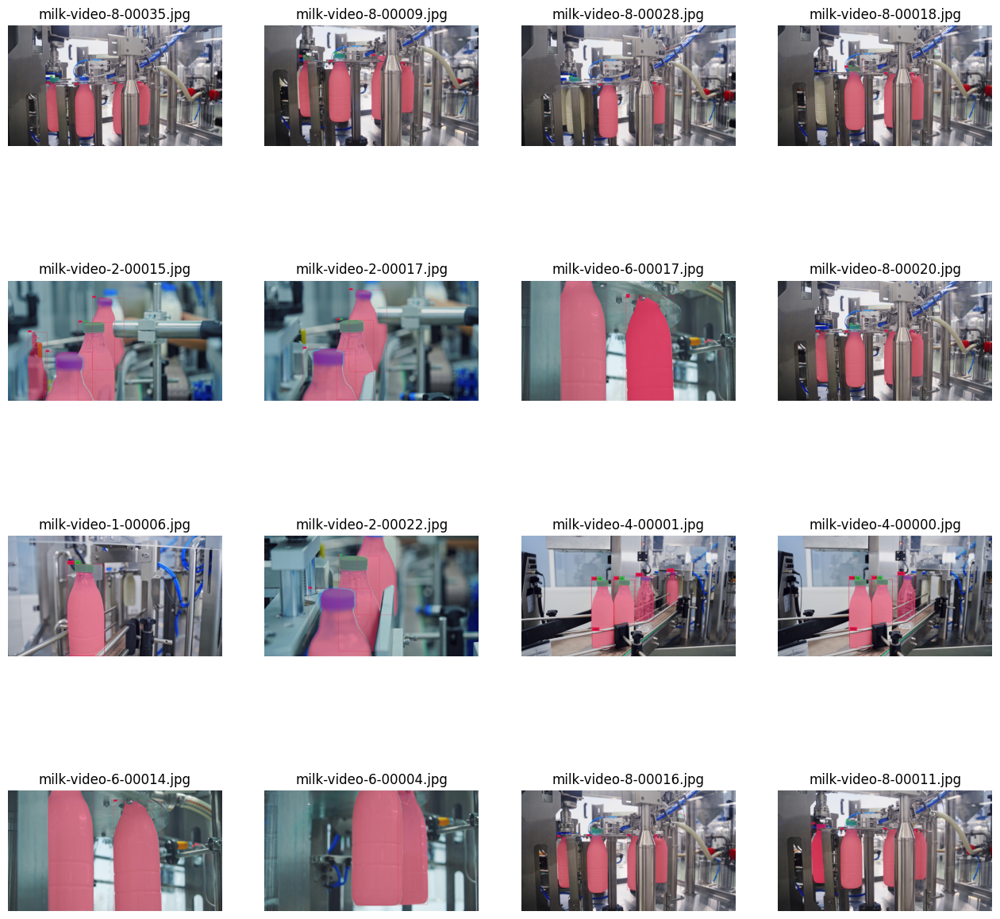

In [21]:
import supervision as sv

image_names = list(dataset.images.keys())[:SAMPLE_SIZE]

mask_annotator = sv.MaskAnnotator()
box_annotator = sv.BoxAnnotator()

images = []
for image_name in image_names:
    image = dataset.images[image_name]
    annotations = dataset.annotations[image_name]
    labels = [
        dataset.classes[class_id]
        for class_id
        in annotations.class_id]
    annotates_image = mask_annotator.annotate(
        scene=image.copy(),
        detections=annotations)
    annotates_image = box_annotator.annotate(
        scene=annotates_image,
        detections=annotations,
        labels=labels)
    images.append(annotates_image)

sv.plot_images_grid(
    images=images,
    titles=image_names,
    grid_size=SAMPLE_GRID_SIZE,
    size=SAMPLE_PLOT_SIZE)


# 👨‍🏫 Train MMDetection Model

In [22]:
%cd {HOME}/mmdetection

/content/mmdetection


### Convert YOLO Dataset to COCO Dataset

Autodistill's default output format is the YOLO dataset. However, it appears that MMDetection currently does not support this format. Therefore, we need to convert the dataset to the COCO format.

```
YOLO Dataset Structure            | COCO Dataset Structure
----------------------------------|----------------------------------
train                             | dataset
├── images                     | ├── images
│   ├── train_img1.jpg        | │   ├── train
│   ├── ...                   | │   │   ├── image1.jpg
├── labels                     | │   │   ├── ...
│   ├── train_img1.txt        | │   └── val
│   ├── ...                   | │       ├── image1.jpg
valid                             | │       ├── ...
├── images                     | └── annotations
│   ├── valid_img1.jpg        |     ├── instances_train.json
│   ├── ...                   |     ├── instances_val.json
├── labels                     |
│   ├── valid_img1.txt        |
│   ├── ...                   |
data.yaml                         |
```

In YOLO format, each coordinate is represented as a ratio of the width and height of the image. Each label file follows this format for every line:

```json
<object-class> <x1> <y1> <x2> <y2> ... <xn> <yn>
```


In COCO format, each entry in the images array represents an image, linked by id to image_id in the annotations array. Each annotations entry represents an object, with bbox for bounding box coordinates and segmentation for polygon coordinates. Each categories entry defines a category, linked by id to category_id in the annotations array.

```json
{"images": [
    {"id": 1, "file_name": "image1.jpg",
     "height": 800, "width": 600},
    ...],
  "annotations": [
    {"id": 1, "image_id": 1, "category_id": 1,
     "bbox": [x_min, y_min, width, height],
     "area": area, "iscrowd": 0,
     "segmentation": [[x1, y1, x2, y2, ..., xn, yn]]},
    ...],
  "categories": [
    {"id": 1, "name": "name1"},
    {"id": 2, "name": "name2"},
    ...]}
```

In [23]:
import json

def create_coco_annotations(image_dir, annotation_dir, output_file, categories):
    images = []
    annotations = []
    category_map = {category: idx + 1 for idx, category in enumerate(categories)}
    annotation_id = 1

    for img_file in tqdm(os.listdir(image_dir)):
        if not img_file.endswith('.jpg'):
            continue
        img_path = os.path.join(image_dir, img_file)
        img = cv2.imread(img_path)
        height, width, _ = img.shape
        img_id = len(images) + 1
        images.append({
            "id": img_id,
            "file_name": img_file,
            "height": height,
            "width": width
        })

        ann_file = os.path.join(annotation_dir, f"{os.path.splitext(img_file)[0]}.txt")
        if os.path.exists(ann_file):
            with open(ann_file, 'r') as f:
                for line in f:
                    line = list(map(float, line.strip().split(' ')))
                    x_coords = [int(line[j] * width) for j in range(1, len(line), 2)]
                    y_coords = [int(line[j + 1] * height) for j in range(1, len(line), 2)]

                    x_min, y_min = min(x_coords), min(y_coords)
                    x_max, y_max = max(x_coords), max(y_coords)

                    bbox = [x_min, y_min, x_max - x_min, y_max - y_min]
                    segmentation = [coord for pair in zip(x_coords, y_coords) for coord in pair]

                    annotations.append({
                        "id": annotation_id,
                        "image_id": img_id,
                        "category_id": int(line[0]+1),
                        "bbox": bbox,
                        "area": (x_max - x_min) * (y_max - y_min),
                        "iscrowd": 0,
                        "segmentation": [segmentation]
                    })
                    annotation_id += 1

    coco_format = {
        "images": images,
        "annotations": annotations,
        "categories": [{"id": idx, "name": name} for name, idx in category_map.items()]
    }

    with open(output_file, 'w') as f:
        json.dump(coco_format, f, indent=4)

In [24]:
# Define your paths and categories
train_img_dir = '/content/dataset/train/images'
train_ann_dir = '/content/dataset/train/labels'
output_train_file = '/content/dataset/annotations/instances_train.json'

val_img_dir = '/content/dataset/valid/images'
val_ann_dir = '/content/dataset/valid/labels'
output_val_file = '/content/dataset/annotations/instances_val.json'
categories = ['bottle', 'cap']

# Create COCO annotations
create_coco_annotations(train_img_dir, train_ann_dir, output_train_file, categories)
create_coco_annotations(val_img_dir, val_ann_dir, output_val_file, categories)

  0%|          | 0/122 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

### Choose pretrained model you want to fine-tune

Go to [configs](https://github.com/open-mmlab/mmdetection/tree/main/configs) folder in MMDetection repository and download any pretrained model you want. In this example, we will train Mask R-CNN with Swin Transformer.

In [25]:
from mmengine.runner import set_random_seed

from mmengine import Config
cfg = Config.fromfile('./configs/swin/mask-rcnn_swin-t-p4-w7_fpn_1x_coco.py')

In [26]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [27]:
!wget -P ./checkpoints https://download.openmmlab.com/mmdetection/v2.0/swin/mask_rcnn_swin-t-p4-w7_fpn_1x_coco/mask_rcnn_swin-t-p4-w7_fpn_1x_coco_20210902_120937-9d6b7cfa.pth

--2024-06-22 04:02:04--  https://download.openmmlab.com/mmdetection/v2.0/swin/mask_rcnn_swin-t-p4-w7_fpn_1x_coco/mask_rcnn_swin-t-p4-w7_fpn_1x_coco_20210902_120937-9d6b7cfa.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 163.181.199.244, 163.181.199.245, 163.181.199.246, ...
Connecting to download.openmmlab.com (download.openmmlab.com)|163.181.199.244|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 191461353 (183M) [application/octet-stream]
Saving to: ‘./checkpoints/mask_rcnn_swin-t-p4-w7_fpn_1x_coco_20210902_120937-9d6b7cfa.pth’

mask_rcnn_swin-t-p4 100%[===================>] 182.59M  20.8MB/s    in 8.6s    

2024-06-22 04:02:13 (21.3 MB/s) - ‘./checkpoints/mask_rcnn_swin-t-p4-w7_fpn_1x_coco_20210902_120937-9d6b7cfa.pth’ saved [191461353/191461353]



In [28]:
from pprint import pprint
pprint(cfg.to_dict())

{'auto_scale_lr': {'base_batch_size': 16, 'enable': False},
 'backend_args': None,
 'data_root': 'data/coco/',
 'dataset_type': 'CocoDataset',
 'default_hooks': {'checkpoint': {'interval': 1, 'type': 'CheckpointHook'},
                   'logger': {'interval': 50, 'type': 'LoggerHook'},
                   'param_scheduler': {'type': 'ParamSchedulerHook'},
                   'sampler_seed': {'type': 'DistSamplerSeedHook'},
                   'timer': {'type': 'IterTimerHook'},
                   'visualization': {'type': 'DetVisualizationHook'}},
 'default_scope': 'mmdet',
 'env_cfg': {'cudnn_benchmark': False,
             'dist_cfg': {'backend': 'nccl'},
             'mp_cfg': {'mp_start_method': 'fork', 'opencv_num_threads': 0}},
 'load_from': None,
 'log_level': 'INFO',
 'log_processor': {'by_epoch': True, 'type': 'LogProcessor', 'window_size': 50},
 'max_epochs': 12,
 'model': {'backbone': {'attn_drop_rate': 0.0,
                        'convert_weights': True,
                    

In [29]:
pprint(cfg.train_dataloader)

{'batch_sampler': {'type': 'AspectRatioBatchSampler'},
 'batch_size': 2,
 'dataset': {'ann_file': 'annotations/instances_train2017.json',
             'backend_args': None,
             'data_prefix': {'img': 'train2017/'},
             'data_root': 'data/coco/',
             'filter_cfg': {'filter_empty_gt': True, 'min_size': 32},
             'pipeline': [{'backend_args': None, 'type': 'LoadImageFromFile'},
                          {'type': 'LoadAnnotations',
                           'with_bbox': True,
                           'with_mask': True},
                          {'keep_ratio': True,
                           'scale': (1333, 800),
                           'type': 'Resize'},
                          {'prob': 0.5, 'type': 'RandomFlip'},
                          {'type': 'PackDetInputs'}],
             'type': 'CocoDataset'},
 'num_workers': 2,
 'persistent_workers': True,
 'sampler': {'shuffle': True, 'type': 'DefaultSampler'}}


In [30]:
cfg.data_root = '/content/dataset'

cfg.metainfo  = {
    'classes': ('bottle', 'cap'),
    'palette': [
        (220, 20, 60),
        (0, 15, 255)
    ]
}

cfg.train_dataloader.dataset.data_root = cfg.data_root
cfg.train_dataloader.dataset.data_prefix = {'img':'train/images'}
cfg.train_dataloader.dataset.ann_file = 'annotations/instances_train.json'
cfg.train_dataloader.dataset.metainfo = cfg.metainfo

cfg.val_dataloader.dataset.data_root = cfg.data_root
cfg.val_dataloader.dataset.data_prefix = {'img':'valid/images'}
cfg.val_dataloader.dataset.ann_file = 'annotations/instances_val.json'
cfg.val_dataloader.dataset.metainfo = cfg.metainfo

cfg.test_dataloader = cfg.val_dataloader

### Modifying the Number of Classes for Each Branch


In [31]:
cfg.model.roi_head.bbox_head.num_classes = 2
cfg.model.roi_head.mask_head.num_classes = 2

In [32]:
cfg.load_from = './checkpoints/mask_rcnn_swin-t-p4-w7_fpn_1x_coco_20210902_120937-9d6b7cfa.pth'
cfg.work_dir = './tutorial_exps'

cfg.train_cfg.val_interval = 12
cfg.default_hooks.checkpoint.interval = 3

cfg.visualizer.vis_backends.append({"type":'TensorboardVisBackend'})

In [33]:
cfg.val_evaluator.ann_file = '/content/dataset/annotations/instances_val.json'

Check the modified configuration before starting the training.

In [34]:
pprint(cfg.to_dict())

{'auto_scale_lr': {'base_batch_size': 16, 'enable': False},
 'backend_args': None,
 'data_root': '/content/dataset',
 'dataset_type': 'CocoDataset',
 'default_hooks': {'checkpoint': {'interval': 3, 'type': 'CheckpointHook'},
                   'logger': {'interval': 50, 'type': 'LoggerHook'},
                   'param_scheduler': {'type': 'ParamSchedulerHook'},
                   'sampler_seed': {'type': 'DistSamplerSeedHook'},
                   'timer': {'type': 'IterTimerHook'},
                   'visualization': {'type': 'DetVisualizationHook'}},
 'default_scope': 'mmdet',
 'env_cfg': {'cudnn_benchmark': False,
             'dist_cfg': {'backend': 'nccl'},
             'mp_cfg': {'mp_start_method': 'fork', 'opencv_num_threads': 0}},
 'load_from': './checkpoints/mask_rcnn_swin-t-p4-w7_fpn_1x_coco_20210902_120937-9d6b7cfa.pth',
 'log_level': 'INFO',
 'log_processor': {'by_epoch': True, 'type': 'LogProcessor', 'window_size': 50},
 'max_epochs': 12,
 'metainfo': {'classes': ('bottle',

In [35]:
from mmengine.runner import Runner

runner = Runner.from_cfg(cfg)
# start training
runner.train()

06/22 04:02:16 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 511118814
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.2, V12.2.140
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.1.0+cu121
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX512
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code=

Downloading: "https://github.com/SwinTransformer/storage/releases/download/v1.0.0/swin_tiny_patch4_window7_224.pth" to /root/.cache/torch/hub/checkpoints/swin_tiny_patch4_window7_224.pth


Loads checkpoint by local backend from path: ./checkpoints/mask_rcnn_swin-t-p4-w7_fpn_1x_coco_20210902_120937-9d6b7cfa.pth
The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([3, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([3]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([8, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoint, the shape in current model is torch.Size([8]).
size mismatch for roi_head.mask_head.conv_logits.weight: copying a param with shape torch.Size([80, 256, 1, 1]) from checkpoint, the shape in current model is to

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


06/22 04:02:52 - mmengine - INFO - Epoch(train)  [1][50/61]  base_lr: 5.0000e-06 lr: 5.0000e-06  eta: 0:06:33  time: 0.5766  data_time: 0.0385  memory: 9588  loss: 12.5045  loss_rpn_cls: 0.0764  loss_rpn_bbox: 0.0276  loss_cls: 0.9830  acc: 81.3477  loss_bbox: 0.3114  loss_mask: 11.1061
06/22 04:02:58 - mmengine - INFO - Exp name: mask-rcnn_swin-t-p4-w7_fpn_1x_coco_20240622_040213
06/22 04:03:26 - mmengine - INFO - Epoch(train)  [2][50/61]  base_lr: 1.1100e-05 lr: 1.1100e-05  eta: 0:05:50  time: 0.5520  data_time: 0.0271  memory: 9554  loss: 2.2690  loss_rpn_cls: 0.0571  loss_rpn_bbox: 0.0328  loss_cls: 0.5305  acc: 88.9648  loss_bbox: 0.2920  loss_mask: 1.3567
06/22 04:03:32 - mmengine - INFO - Exp name: mask-rcnn_swin-t-p4-w7_fpn_1x_coco_20240622_040213
06/22 04:03:59 - mmengine - INFO - Epoch(train)  [3][50/61]  base_lr: 1.7200e-05 lr: 1.7200e-05  eta: 0:05:13  time: 0.5517  data_time: 0.0263  memory: 9579  loss: 1.0807  loss_rpn_cls: 0.0411  loss_rpn_bbox: 0.0318  loss_cls: 0.2600 

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


06/22 04:09:42 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.797
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.905
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.885
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.804
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.772
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.870
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.870
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.870
 Averag

MaskRCNN(
  (data_preprocessor): DetDataPreprocessor()
  (backbone): SwinTransformer(
    (patch_embed): PatchEmbed(
      (adap_padding): AdaptivePadding()
      (projection): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
      (norm): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
    )
    (drop_after_pos): Dropout(p=0.0, inplace=False)
    (stages): ModuleList(
      (0): SwinBlockSequence(
        (blocks): ModuleList(
          (0-1): 2 x SwinBlock(
            (norm1): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
            (attn): ShiftWindowMSA(
              (w_msa): WindowMSA(
                (qkv): Linear(in_features=96, out_features=288, bias=True)
                (attn_drop): Dropout(p=0.0, inplace=False)
                (proj): Linear(in_features=96, out_features=96, bias=True)
                (proj_drop): Dropout(p=0.0, inplace=False)
                (softmax): Softmax(dim=-1)
              )
              (drop): DropPath()
            )
            (

In [36]:
!pip install tensorboard -q -i https://mirrors.ustc.edu.cn/pypi/web/simple

In [37]:
%load_ext tensorboard

In [38]:
%tensorboard --logdir tutorial_exps/

<IPython.core.display.Javascript object>

In [40]:
import mmcv
from mmdet.apis import init_detector, inference_detector
img = mmcv.imread('/content/dataset/train/images/milk-video-1-00002.jpg',channel_order='rgb')
checkpoint_file = 'tutorial_exps/epoch_12.pth'
model = init_detector(cfg, checkpoint_file, device='cuda')
new_result = inference_detector(model, img)
print(new_result)

Loads checkpoint by local backend from path: tutorial_exps/epoch_12.pth
<DetDataSample(

    META INFORMATION
    img_shape: (750, 1333)
    ori_shape: (1080, 1920)
    img_id: 0
    pad_shape: (768, 1344)
    batch_input_shape: (768, 1344)
    img_path: None
    scale_factor: (0.6942708333333333, 0.6944444444444444)

    DATA FIELDS
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([0, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')
            bboxes: tensor([[ 616.2457,  215.2749,  894.2488,  983.2699],
                        [ 677.1259,  203.6812,  817.4349,  257.7405],
                        [ 921.9646,  301.9439, 1049.7220,  701.4792],
                        [ 724.6064,  206.3142,  813.5013,  248.9608],
                        [ 677.9623,  202.4479,  749.8738,  254.1879],
                        [ 677.7524,  230.3264,  815.6290,  259.1898],
                        [1414.4214,  302.1888, 1519.6156,  567.2

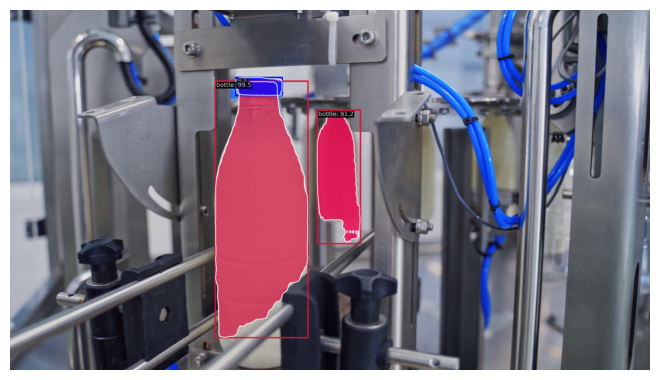

In [41]:
from mmengine.visualization import Visualizer
# get built visualizer
visualizer_now = Visualizer.get_current_instance()
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer_now.dataset_meta = model.dataset_meta
# show the results
visualizer_now.add_datasample(
    'new_result',
    img,
    data_sample=new_result,
    draw_gt=False,
    wait_time=0,
    out_file=None,
    pred_score_thr=0.5
)
visualizer_now.show()